<a href="https://colab.research.google.com/github/ManuelProy/BD_PROYECT/blob/master/yolov5-custom-training.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Custom Training with YOLOv5

In this tutorial, we assemble a dataset and train a custom YOLOv5 model to recognize the objects in our dataset. To do so we will take the following steps:

* Gather a dataset of images and label our dataset
* Export our dataset to YOLOv5
* Train YOLOv5 to recognize the objects in our dataset
* Evaluate our YOLOv5 model's performance
* Run test inference to view our model at work



![](https://uploads-ssl.webflow.com/5f6bc60e665f54545a1e52a5/615627e5824c9c6195abfda9_computer-vision-cycle.png)

# Step 1: Install Requirements

In [1]:
#clone YOLOv5 and
!git clone https://github.com/ultralytics/yolov5  # clone repo
%cd yolov5
%pip install -qr requirements.txt # install dependencies
%pip install -q roboflow

import torch
import os
from IPython.display import Image, clear_output  # to display images

print(f"Setup complete. Using torch {torch.__version__} ({torch.cuda.get_device_properties(0).name if torch.cuda.is_available() else 'CPU'})")

Cloning into 'yolov5'...
remote: Enumerating objects: 16562, done.
remote: Counting objects: 100% (40/40), done.
remote: Compressing objects: 100% (27/27), done.
remote: Total 16562 (delta 20), reused 30 (delta 13), pack-reused 16522
Receiving objects: 100% (16562/16562), 15.07 MiB | 26.37 MiB/s, done.
Resolving deltas: 100% (11373/11373), done.
/content/yolov5
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.3/207.3 kB 2.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.5/4.5 MB 15.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 750.8/750.8 kB 17.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.7/62.7 kB 4.3 MB/s eta 0:00:00
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
imageio 2.31.6 requires pillow<10.1.0,>=8.3.2, but you have pillow 10.3.0 which is incompatible.
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━

# Step 2: Assemble Our Dataset

In order to train our custom model, we need to assemble a dataset of representative images with bounding box annotations around the objects that we want to detect. And we need our dataset to be in YOLOv5 format.

In Roboflow, you can choose between two paths:

* Convert an existing dataset to YOLOv5 format. Roboflow supports over [30 formats object detection formats](https://roboflow.com/formats) for conversion.
* Upload raw images and annotate them in Roboflow with [Roboflow Annotate](https://docs.roboflow.com/annotate).

# Annotate

![](https://roboflow-darknet.s3.us-east-2.amazonaws.com/roboflow-annotate.gif)

# Version

![](https://roboflow-darknet.s3.us-east-2.amazonaws.com/robolfow-preprocessing.png)


In [2]:
from roboflow import Roboflow
rf = Roboflow(model_format="yolov5", notebook="ultralytics")

RuntimeError: API Key is of Incorrect Type 
 Expected Type: <class 'str'>
 Input Type: <class 'NoneType'>

In [3]:
# set up environment
os.environ["DATASET_DIRECTORY"] = "/content/datasets"

In [4]:
!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="mJXrfutt9KmszOtpDfCy")
project = rf.workspace("basket-fbakf").project("basket-action")
version = project.version(3)
dataset = version.download("yolov5")


loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to /content/datasets/basket-action-3 in yolov5pytorch:: 100%|██████████| 1945/1945 [00:00<00:00, 5159.06it/s]


# Step 3: Train Our Custom YOLOv5 model

Here, we are able to pass a number of arguments:
- **img:** define input image size
- **batch:** determine batch size
- **epochs:** define the number of training epochs. (Note: often, 3000+ are common here!)
- **data:** Our dataset locaiton is saved in the `dataset.location`
- **weights:** specify a path to weights to start transfer learning from. Here we choose the generic COCO pretrained checkpoint.
- **cache:** cache images for faster training

In [5]:
!python train.py --img 416 --batch 16 --epochs 150 --data {dataset.location}/data.yaml --weights yolov5s.pt --cache

2024-04-21 10:00:52.001350: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-04-21 10:00:52.001414: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-04-21 10:00:52.002803: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
train: weights=yolov5s.pt, cfg=, data=/content/datasets/basket-action-3/data.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=150, batch_size=16, imgsz=416, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, evolve_population=data/hyps, resume_evolve=None, bucket=, cache=ram, image_weights=False, device=, multi_sc

# Evaluate Custom YOLOv5 Detector Performance
Training losses and performance metrics are saved to Tensorboard and also to a logfile.

If you are new to these metrics, the one you want to focus on is `mAP_0.5` - learn more about mean average precision [here](https://blog.roboflow.com/mean-average-precision/).

In [6]:
# Start tensorboard
# Launch after you have started training
# logs save in the folder "runs"
%load_ext tensorboard
%tensorboard --logdir runs

<IPython.core.display.Javascript object>

#Run Inference  With Trained Weights
Run inference with a pretrained checkpoint on contents of `test/images` folder downloaded from Roboflow.

In [7]:
!python detect.py --weights runs/train/exp/weights/best.pt --img 416 --conf 0.1 --source {dataset.location}/test/images

detect: weights=['runs/train/exp/weights/best.pt'], source=/content/datasets/basket-action-3/test/images, data=data/coco128.yaml, imgsz=[416, 416], conf_thres=0.1, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_csv=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-304-g22361691 Python-3.10.12 torch-2.2.1+cu121 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
Model summary: 157 layers, 7029004 parameters, 0 gradients, 15.8 GFLOPs
image 1/25 /content/datasets/basket-action-3/test/images/yt-6C24WErIJ0w-0001_jpg.rf.1f8a81493fdc7ac66e6818af24c5ed84.jpg: 416x416 5 Defenses, 1 Playing Ball, 6.9ms
image 2/25 /content/datasets/basket-action-3/test/images/yt-6C24WErIJ0w-0009_jpg.rf.fff408a91e10864b2a80cca59d5397fc.jpg: 416x416 2 Defenses

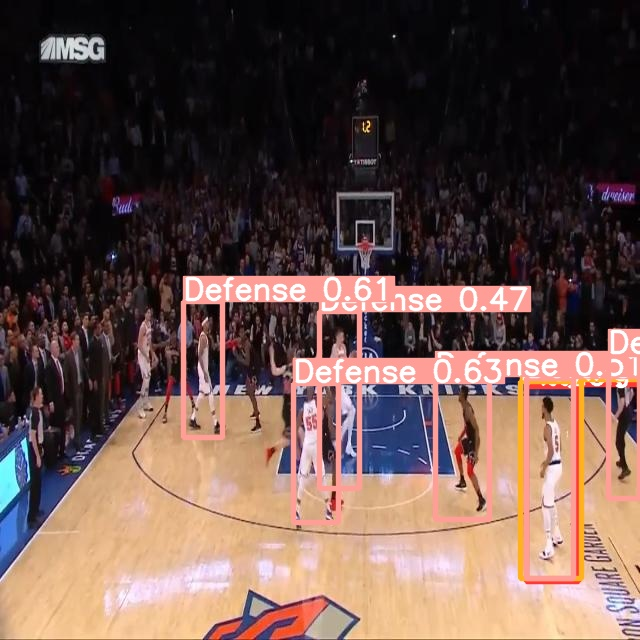

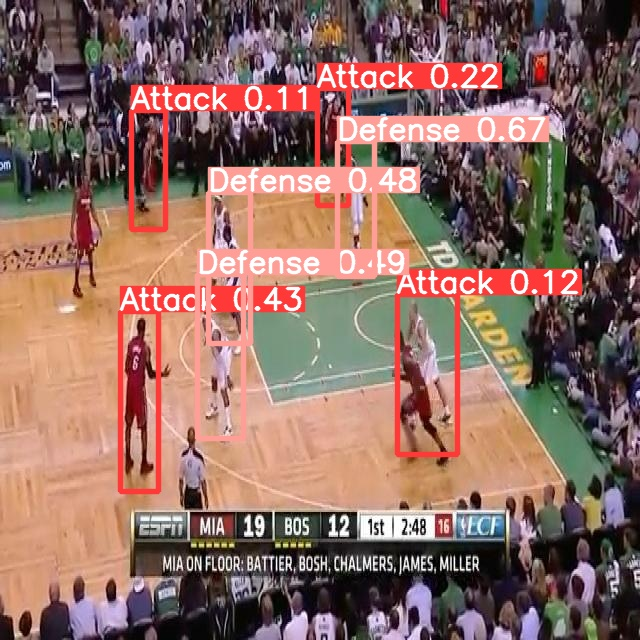

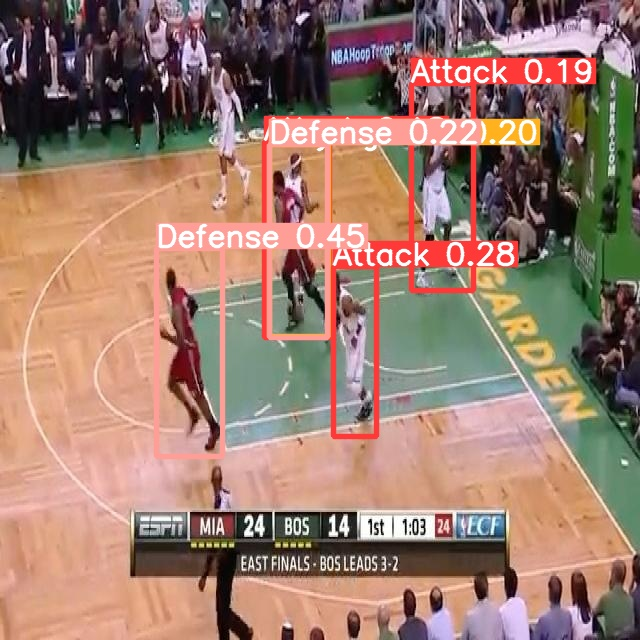

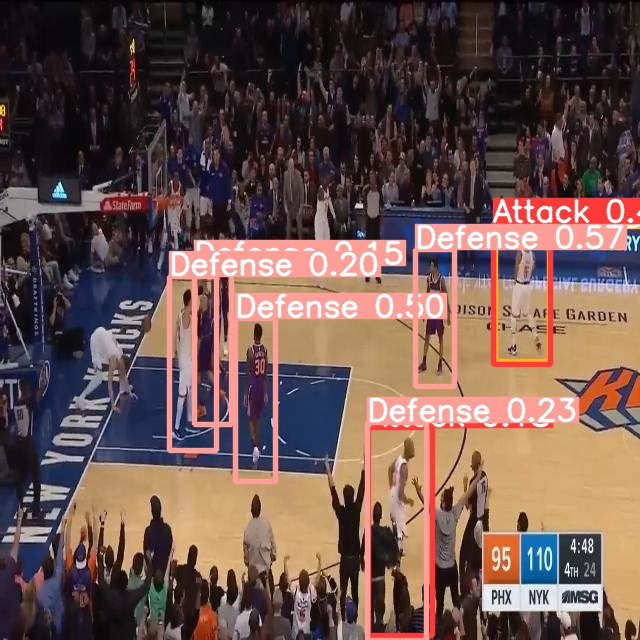

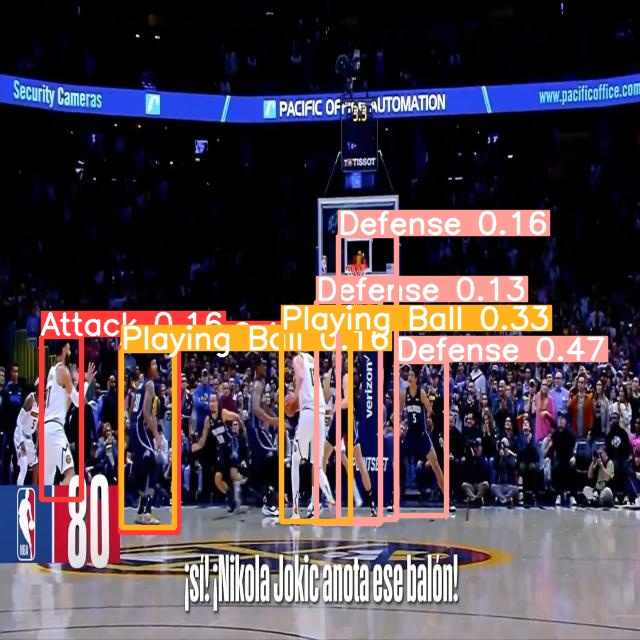

...

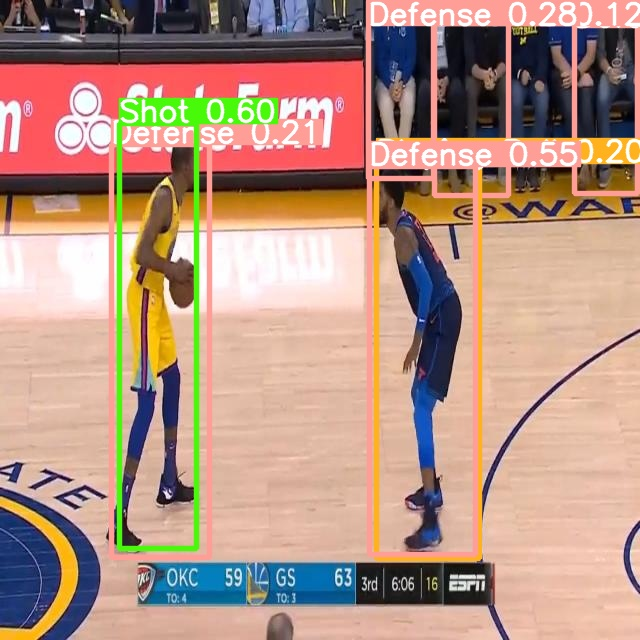

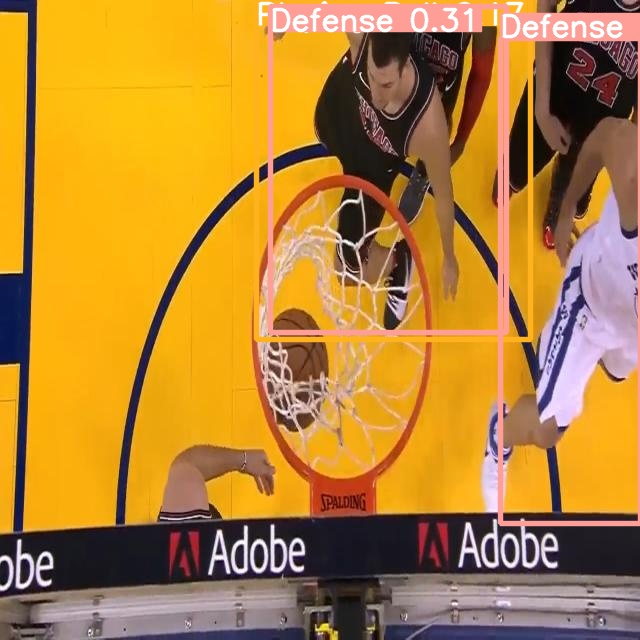

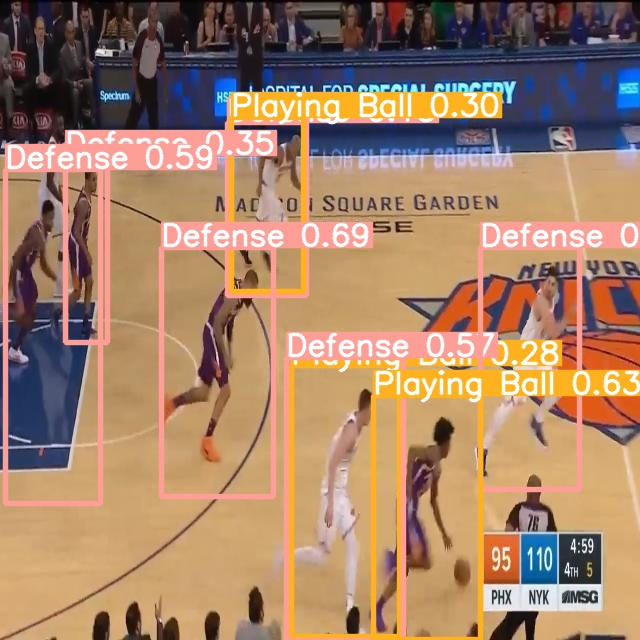

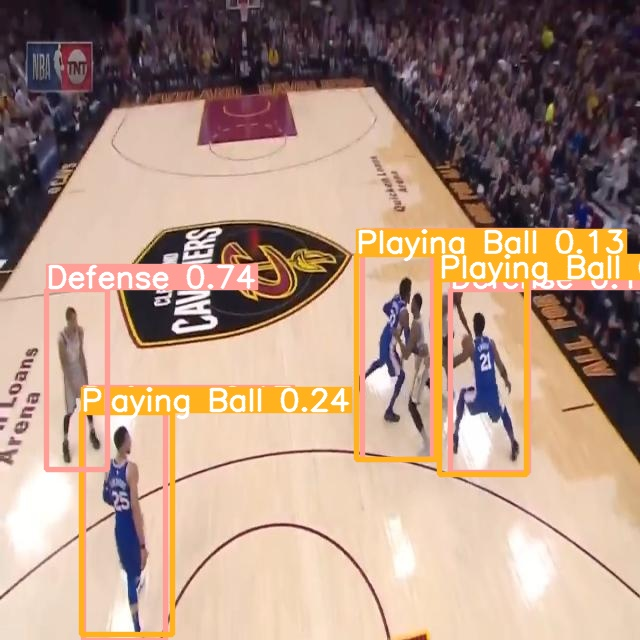

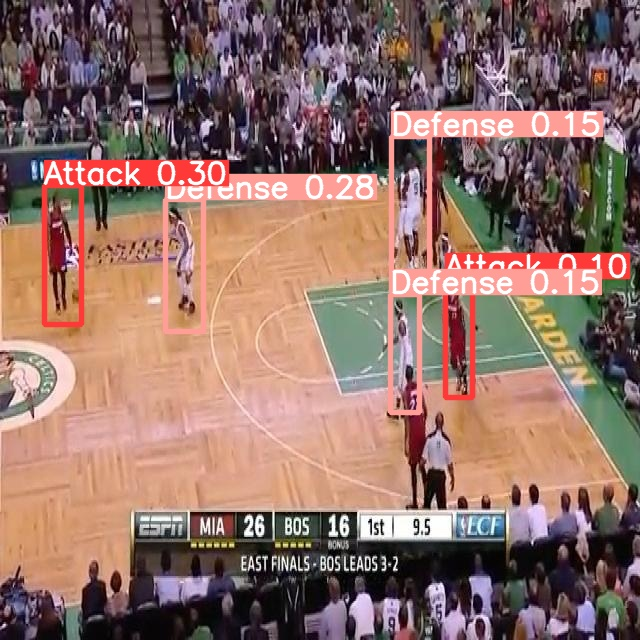

In [8]:
#display inference on ALL test images

import glob
from IPython.display import Image, display

for imageName in glob.glob('/content/yolov5/runs/detect/exp/*.jpg'): #assuming JPG
    display(Image(filename=imageName))
    print("\n")

# Conclusion and Next Steps

Congratulations! You've trained a custom YOLOv5 model to recognize your custom objects.

To improve you model's performance, we recommend first interating on your datasets coverage and quality. See this guide for [model performance improvement](https://github.com/ultralytics/yolov5/wiki/Tips-for-Best-Training-Results).

To deploy your model to an application, see this guide on [exporting your model to deployment destinations](https://github.com/ultralytics/yolov5/issues/251).

Once your model is in production, you will want to continually iterate and improve on your dataset and model via [active learning](https://blog.roboflow.com/what-is-active-learning/).

In [ ]:
#export your model's weights for future use
from google.colab import files
files.download('./runs/train/exp/weights/best.pt')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [26]:
!python detect.py --weights runs/train/exp/weights/best.pt --img 416 --conf 0.40 --source '/content/luka2.mp4'

Se han truncado las últimas 5000 líneas del flujo de salida.
video 1/1 (12626/17623) /content/luka2.mp4: 256x416 4 Defenses, 5.6ms
video 1/1 (12627/17623) /content/luka2.mp4: 256x416 5 Defenses, 5.8ms
video 1/1 (12628/17623) /content/luka2.mp4: 256x416 5 Defenses, 10.2ms
video 1/1 (12629/17623) /content/luka2.mp4: 256x416 6 Defenses, 6.1ms
video 1/1 (12630/17623) /content/luka2.mp4: 256x416 5 Defenses, 5.4ms
video 1/1 (12631/17623) /content/luka2.mp4: 256x416 4 Defenses, 5.8ms
video 1/1 (12632/17623) /content/luka2.mp4: 256x416 4 Defenses, 5.6ms
video 1/1 (12633/17623) /content/luka2.mp4: 256x416 4 Defenses, 5.4ms
video 1/1 (12634/17623) /content/luka2.mp4: 256x416 4 Defenses, 5.9ms
video 1/1 (12635/17623) /content/luka2.mp4: 256x416 4 Defenses, 5.7ms
video 1/1 (12636/17623) /content/luka2.mp4: 256x416 5 Defenses, 5.8ms
video 1/1 (12637/17623) /content/luka2.mp4: 256x416 4 Defenses, 6.1ms
video 1/1 (12638/17623) /content/luka2.mp4: 256x416 3 Defenses, 7.0ms
video 1/1 (12639/17623) /con

In [13]:
!pip install youtube-dl

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.9/1.9 MB 9.5 MB/s eta 0:00:00


In [15]:
#https://github.com/ytdl-org/youtube-dl/blob/master/README.md#embedding-youtube-dl
from __future__ import unicode_literals
#Imports the module
import youtube_dl
#You would put the advanced settings in between the brackets
ydl_opts = {}
with youtube_dl.YoutubeDL(ydl_opts) as ydl:
  #Swap in your YouTube videos here
  ydl.download(['https://www.youtube.com/watch?v=MlzL6bT1C2U'])

[youtube] MlzL6bT1C2U: Downloading webpage


ERROR: Unable to extract uploader id; please report this issue on https://yt-dl.org/bug . Make sure you are using the latest version; see  https://yt-dl.org/update  on how to update. Be sure to call youtube-dl with the --verbose flag and include its complete output.


DownloadError: ERROR: Unable to extract uploader id; please report this issue on https://yt-dl.org/bug . Make sure you are using the latest version; see  https://yt-dl.org/update  on how to update. Be sure to call youtube-dl with the --verbose flag and include its complete output.

In [16]:
!pip install yt-dlp
!yt-dlp https://www.youtube.com/watch?v=MlzL6bT1C2U

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.1/3.1 MB 15.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.0/3.0 MB 33.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 194.4/194.4 kB 25.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.1/2.1 MB 43.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 130.2/130.2 kB 17.8 MB/s eta 0:00:00
[youtube] Extracting URL: https://www.youtube.com/watch?v=MlzL6bT1C2U
[youtube] MlzL6bT1C2U: Downloading webpage
[youtube] MlzL6bT1C2U: Downloading ios player API JSON
[youtube] MlzL6bT1C2U: Downloading android player API JSON
[youtube] MlzL6bT1C2U: Downloading m3u8 information
[info] MlzL6bT1C2U: Downloading 1 format(s): 247+251
[download] Destination: Michael Jordan • Last Shot [MlzL6bT1C2U].f247.webm
[download] 100% of    7.41MiB in 00:00:00 at 23.03MiB/s
[download] Destination: Michael Jordan • Last Shot [MlzL6bT1C2U].f251.webm
[download] 100% of  578.63KiB in 00:00:00 at 10.09MiB/s
[Me

In [19]:
ffmpeg -fflags +genpts -i a.webm -r 24 "1.mp4"


SyntaxError: invalid syntax (<ipython-input-19-c3ce12dc720e>, line 1)

In [23]:
ffmpeg -i 'a.webm' -c copy 'output.mp4'


SyntaxError: invalid syntax (<ipython-input-23-f4e50a51a0d5>, line 1)

In [21]:
!pip install ffmpeg

  Preparing metadata (setup.py) ... done
  Created wheel for ffmpeg: filename=ffmpeg-1.4-py3-none-any.whl size=6082 sha256=f98232c7184ca6c183aac559efc7fd66532ff5ef8600bd718fba9962a63a0839
  Stored in directory: /root/.cache/pip/wheels/8e/7a/69/cd6aeb83b126a7f04cbe7c9d929028dc52a6e7d525ff56003a
Successfully built ffmpeg
